# Human Activity Recognition

Human Activity Recognition is an active research area in computer vision and image information retrieval. While it has myriads of application in surveillance, image analysis, annotations, recoginising actions from still images posses many challenges. One of the primary reasons behind this is that same human actions can vary in postures, viewpoints and complicated background, making it difficult to recognising patterns. In an attempt to overcome these issues, many deep learning based methods have been developed over the years, achieving superior performance. In this work, we attempt to leverage existing knowledge from the literature and apply it to our tasks. Here, we are interested in identifying human actions as well as action classes from still images. We use Stanford Action 40 image dataset, a popular database actively used to validate novel methods in the literature.   

In [ ]:
#Import required libraries
import pathlib
import shutil
import tempfile
import os
import pandas as pd
import numpy as np

#Plotting
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

# Data preparation
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

# Image processing
from PIL import Image
from itertools import cycle
from  IPython import display
from scipy.interpolate import interp1d
from scipy.ndimage.interpolation import rotate, shift

# Modelling libraries
import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Lambda, Input
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras.metrics import categorical_accuracy
from tensorflow.keras import regularizers, optimizers

np.random.seed(123)
tf.random.set_seed(123)

import warnings
warnings.filterwarnings('ignore')
print('Setup Complete!!!')

Setup Complete!!!


In [ ]:
# import zipfile
# with zipfile.ZipFile('/content/drive/MyDrive/deep_learning_assignment/A1_data/Images.zip', 'r') as zip_ref:
#     zip_ref.extractall('/content/drive/MyDrive/deep_learning_assignment/A1_data/')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Static Configurations
IMAGE_DIR = '/content/drive/MyDrive/deep_learning_assignment/A1_data/Images/'
DATA_DIR = '/content/drive/MyDrive/deep_learning_assignment/A1_data/'

## Data

In [ ]:
# Load Data
train_data = pd.read_csv(DATA_DIR + 'S40AR_train_data.csv')
test_data = pd.read_csv(DATA_DIR + 'S40AR_test_data.csv')
print('Train Data Shape: ', train_data.shape)
print('Test Data Shape: ', test_data.shape)

Train Data Shape:  (3030, 3)
Test Data Shape:  (2100, 1)


## Exploratory Data Analysis

In [ ]:
# Helper functions to plot targets an its frequencies 
def plot_targets(df,cols):
  plt.figure(figsize = (12,6))
  for i, col in enumerate(cols):
    plt.subplot(1,2,i+1)
    df[col].value_counts(normalize = True).sort_values().plot.barh(width = 0.8)
    plt.title("Distribution  of " + str(col).capitalize())
    plt.xlabel("Count")
    plt.ylabel("Targets")
  plt.tight_layout()
  plt.show()

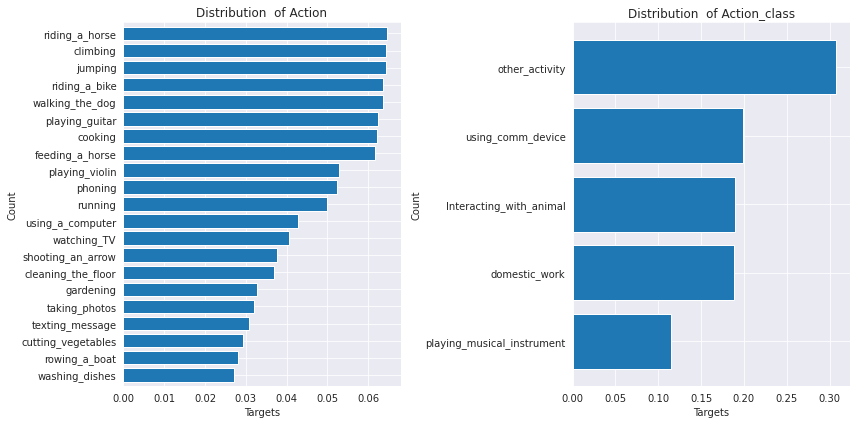

In [ ]:
#Target classes
targets = ['action','action_class']
plot_targets(train_data,targets)

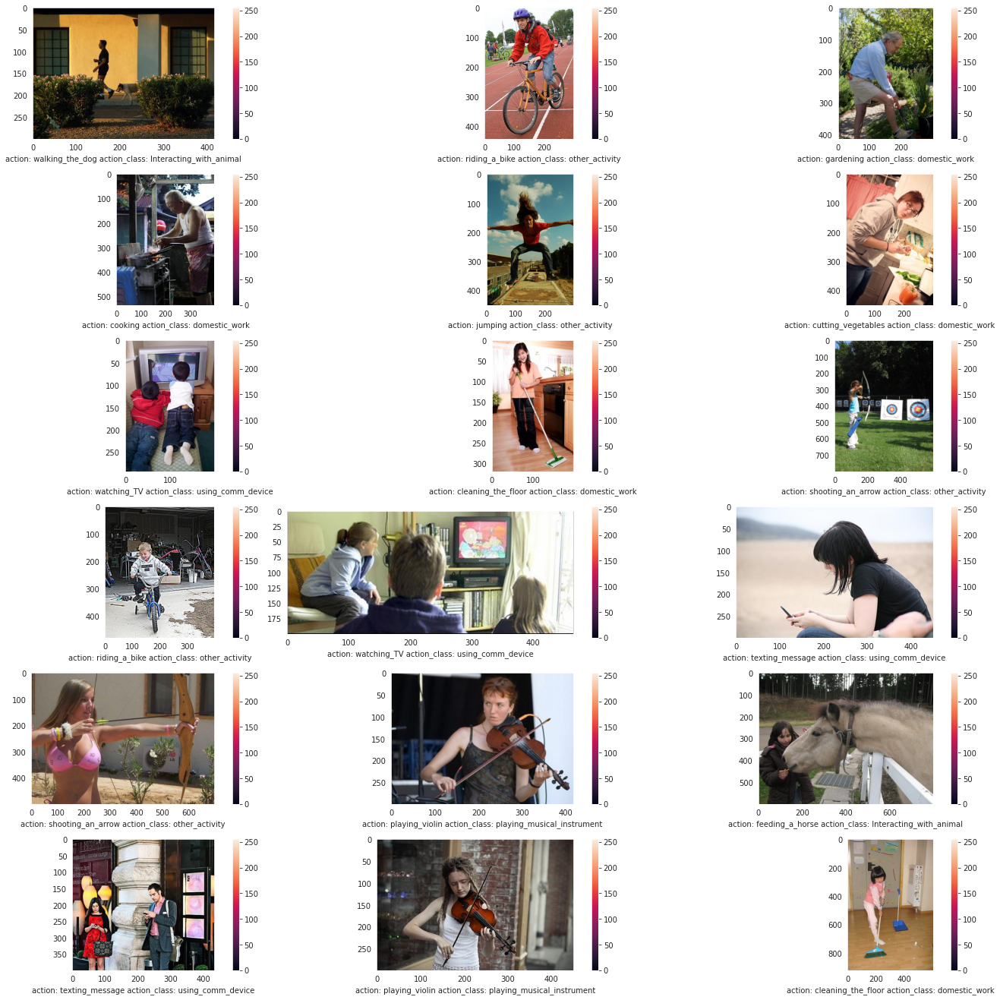

In [ ]:
# Explore Images 
plt.figure(figsize = (20,20))
for i in range(18):
  plt.subplot(6, 3, i+1)
  plt.imshow(Image.open(os.path.join(IMAGE_DIR,train_data['FileName'][i])))
  plt.xlabel('action: '+ str(train_data['action'][i]) + ' action_class: '+ str(train_data['action_class'][i]))
  plt.colorbar()
  plt.grid(False)
  plt.tight_layout(rect = [0, 0.03, 1, 0.95])
plt.show()

In [ ]:
#Get Image size: The most common size is 400X300
from tqdm import tqdm
def get_image_sizes(df):
  sizes = []
  for img in tqdm(df['FileName'],total = len(df['FileName'])):
    sizes.append(Image.open(os.path.join(IMAGE_DIR, img)).size)
  df['Size'] = sizes
  df['Size'].value_counts(normalize = True).sort_values().tail().plot.barh(width = 0.8)
  plt.show()

#### Observation

From the above exploration we can observe that:
* There are 21 classes for actions unevenly distributed where majority of actions are 'riding a horse', 'climbiing' and 'jumping', whereas minority are 'washing dishes', 'cutting vegetables', 'rowing a boat'.
* There are 5 different action classes with most of them labelled as other activities. 
* There are variations in the size of the images where the most common image size is 400X300. To proceed with our tasks, we need to select an appropriate fixed image size where we don't loose information and can be easily recognisable by a human. 
* Evaluation Framework: Since there is only slight imabalances in classes and each action is independent, we evaluate the performance of our model based on precision of each class labels, and macro average f1-score. In addition, we closely look at the errors made by the classifier and select the best model where only complex actions could not be differentiated.  


#### Utils Functions

In [ ]:
def plot_from_generator(generator):
  plt.figure(figsize = (20,8))
  i = 0
  for x,[y,z] in generator.__iter__():
    plt.subplot(2,4,i+1)
    plt.imshow(x[0,:,:,0])
    plt.xlabel('action: ' + str(y[i]) + '_'+ 'action_class: ' + str(z[i]))
    plt.colorbar()
    plt.grid(False)
    i += 1
    if i == 7:
      break
  plt.tight_layout(rect = [0, 0.03, 1, 0.95])
  return plt.show()


def plot_learning_curve(train_loss, val_loss, train_metric, val_metric, title, metric_name='Accuracy'):
    plt.figure(figsize=(15,8))
    
    plt.subplot(1,2,1)
    plt.plot(train_loss, 'r--')
    plt.plot(val_loss, 'b--')
    plt.xlabel("epochs")
    plt.ylabel("Loss")
    plt.legend(['train', 'val'], loc='upper left')

    plt.subplot(1,2,2)
    plt.plot(train_metric, 'r--')
    plt.plot(val_metric, 'b--')
    plt.xlabel("epochs")
    plt.ylabel(metric_name)
    plt.legend(['train', 'val'], loc='upper left')
    plt.suptitle(title)
    plt.show()

In [ ]:
#Tensorboard set up
logdir = pathlib.Path(tempfile.mkdtemp())/"tensorboard_logs"
shutil.rmtree(logdir, ignore_errors=True)

# Load the TensorBoard notebook extension
%load_ext tensorboard

# Open an embedded TensorBoard viewer
%tensorboard --logdir {logdir}/models

<IPython.core.display.Javascript object>

## Data Preparation

### Encoding Targets

In [ ]:
#Encode labels
action_encoder = LabelEncoder()
action_cls_encoder = LabelEncoder()
train_data['action_label'] = action_encoder.fit_transform(train_data['action'])
train_data['action_class_label'] = action_cls_encoder.fit_transform(train_data['action_class'])

### Data Splits

In [ ]:
#Split data into training, validation and test set
train, test = train_test_split(train_data, test_size = 0.2, random_state = 42, stratify = train_data[['action_label','action_class_label']])
train, valid = train_test_split(train, test_size = 0.2, random_state = 42, stratify = train[['action_label','action_class_label']])

In [ ]:
print('Train Size: ', train.shape[0])
print('Validation Size: ', valid.shape[0])
print('Test Size: ', test.shape[0])

Train Size:  1939
Validation Size:  485
Test Size:  606


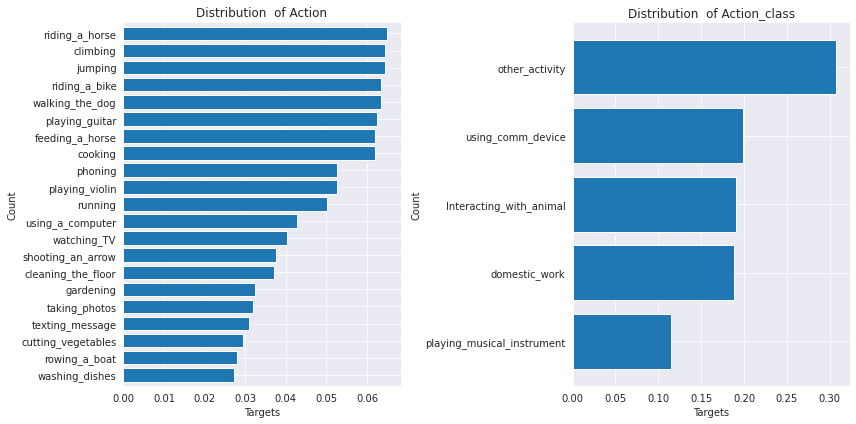

In [ ]:
plot_targets(train, targets)

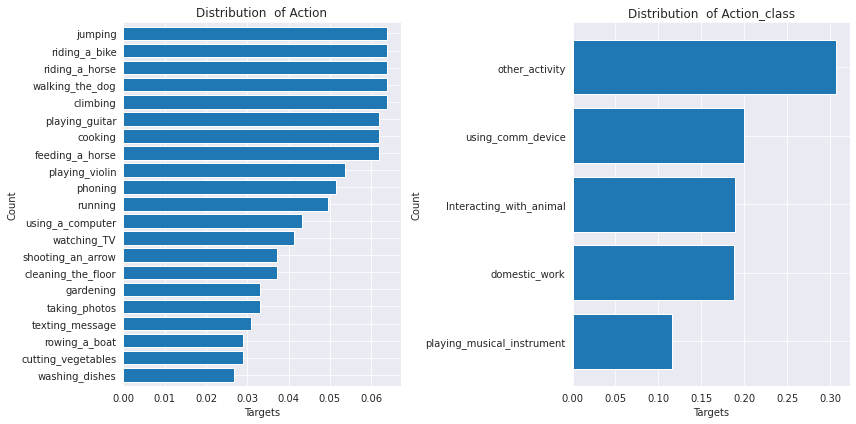

In [ ]:
plot_targets(valid, targets)

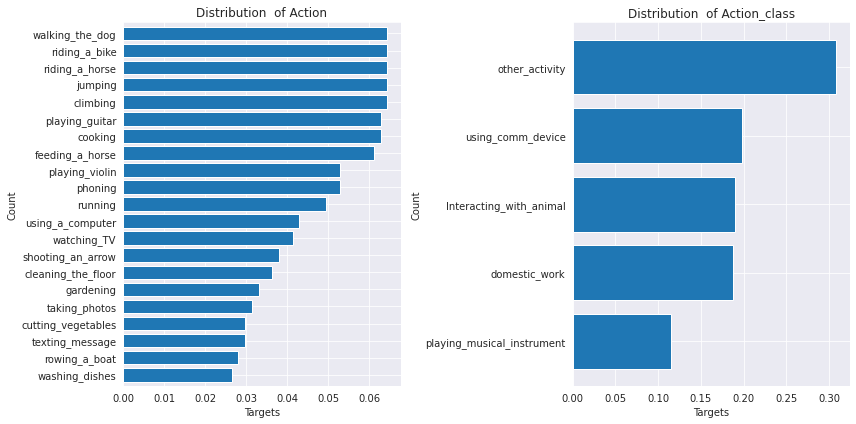

In [ ]:
plot_targets(test, targets)

### Image Data Loader

In [ ]:
# Data Generator
class ImageDataLoader(tf.keras.utils.Sequence):
    def __init__(self,
                 df,
                 batch_size=32,
                 dim=(224,224, 3),
                 img_size = (224,224),
                 n_actions =21,
                 n_action_cls = 5,
                 data_mean=0,
                 data_std=1,
                 data_prefix='',
                 shuffle=True,
                 Augment=True):
        
        'Initialization'
        self.dim = dim  # Dimensions of the input
        self.batch_size = batch_size # Batch size
        self.img_size = img_size # Image size
        self.n_actions = n_actions  # Number of actions
        self.n_action_cls = n_action_cls  # Number of action class   
        self.shuffle = shuffle  # Flag to shuffle data at the end of epoch
        self.Augment = Augment  # Flag to augment the data

        # The data is input as a pandas dataframe, we need to read the relevent fields
        self.df = df
        self.action = df['action_label'].values.tolist()
        self.action_class = df['action_class_label'].values.tolist()
        self.image_ids = np.arange(len(self.df.index)).tolist()
        self.data_prefix = data_prefix
        
        # Data normalization parameters
        self.data_mean = data_mean
        self.data_std = data_std
        
        self.on_epoch_end()
        
    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.image_ids) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data for the given index'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        
        # Find list of IDs
        data_ids_temp = [self.image_ids[k] for k in indexes]
        action_temp = [self.action[k] for k in indexes]
        action_class_temp = [self.action_class[k] for k in indexes]
        
        # Generate data
        X, first_target, second_target = self.__data_generation(data_ids_temp, action_temp, action_class_temp)
        
        return X,[first_target, second_target]

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.image_ids))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)
            
    def __data_generation(self, data_ids_temp, action_temp, action_class_temp):
        'Generates data containing batch_size samples' 

        # Initialization
        X = np.empty((self.batch_size, *self.dim))
        first_target = np.empty((self.batch_size), dtype=int)
        second_target = np.empty((self.batch_size), dtype = int)
        
        # Generate data
        for i, ids in enumerate(data_ids_temp):
            
            X[i,] = self.__read_data_instance(data_ids_temp[i])
            first_target[i] = action_temp[i]
            second_target[i] = action_class_temp[i]
            
        return X, first_target, second_target


    def __read_data_instance(self, pid):
      # Read an image
      filepath = self.data_prefix + self.df.iloc[pid]['FileName']
      
      data = Image.open(filepath)
      data = data.resize(self.img_size) # Resize image
      data = np.asarray(data) # Convert into numpy array
      
      #Augmentation techniques
      if self.Augment:
        data = tf.image.resize_with_crop_or_pad(data, 240, 240)
        data = tf.image.random_crop(data, size = [224,224,3])
        data = tf.image.random_flip_left_right(data)
        data = tf.image.random_brightness(data, max_delta = 0.5)
        rot = np.random.rand(1) < 0.5
        if rot:
            rot = np.random.randint(-15,15, size=1)
            data = rotate(data, angle=rot[0], reshape=False)
          
        shift_val = np.random.randint(-5, high=5, size=2, dtype=int).tolist() + [0,]
        data = shift(data, shift_val, order=0, mode='constant', cval=0.0, prefilter=False)

      X = data
      # Input normalization
      X = (X - self.data_mean)/self.data_std
      return X

## Model Building

In [ ]:
# Model Buidling Static Configurations

BATCH_SIZE = 64
IMG_DIM = (224, 224, 3)
IMG_SIZE = (224, 224)
NUM_EPOCHS = 100 #Num Epochs
CHECKPOINT_DIR = '/content/drive/MyDrive/deep_learning_assignment/A1_data/checkpoint/' #Checkpoint
N_TRAIN = train.shape[0] # Num of training examples
STEPS_PER_EPOCH = N_TRAIN//BATCH_SIZE # Steps for scheduler
LR = 0.01 # Learning rate
model_histories = {}

In [ ]:
# Training params
train_params = {'dim':IMG_DIM,
    'img_size':IMG_SIZE,
    'batch_size':BATCH_SIZE,
    'data_mean':0.,
    'data_std':255.0,
    'Augment':False,
    'shuffle':True,
    'data_prefix': IMAGE_DIR}

# No shuffle because we don't compute GD here!
val_params = {'dim':IMG_DIM,
    'img_size':IMG_SIZE,
    'batch_size':BATCH_SIZE,
    'data_mean':0.,
    'data_std':255.0,
    'Augment':False,
    'shuffle':False,
    'data_prefix': IMAGE_DIR}

# Training Generator with Augment Flag
aug_params = {'dim':IMG_DIM,
    'img_size':IMG_SIZE,
    'batch_size':BATCH_SIZE,
    'data_mean':0.,
    'data_std':255.0,
    'Augment':True,
    'shuffle':True,
    'data_prefix': IMAGE_DIR}

no_aug_train_generator = ImageDataLoader(train,**train_params) # Training generator no augment
aug_train_generator = ImageDataLoader(train,**aug_params) # Training generator augment
validation_generator = ImageDataLoader(valid,**val_params) # Validation generator

### Original Images

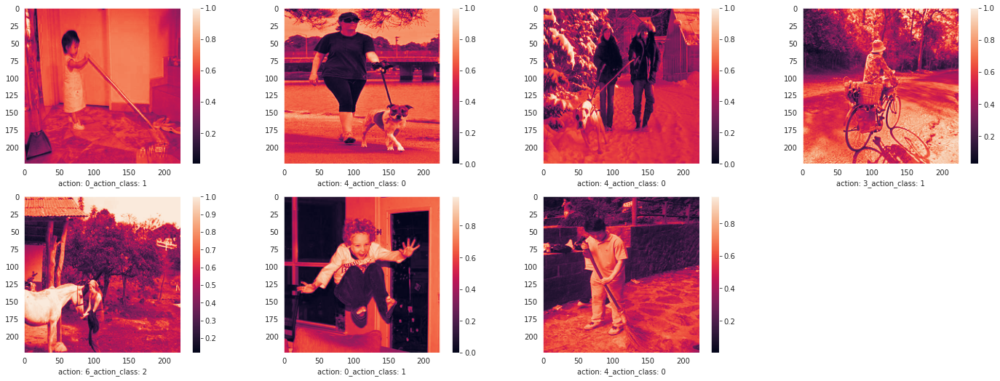

In [ ]:
plot_from_generator(no_aug_train_generator)

### Images from Data Augmentaion

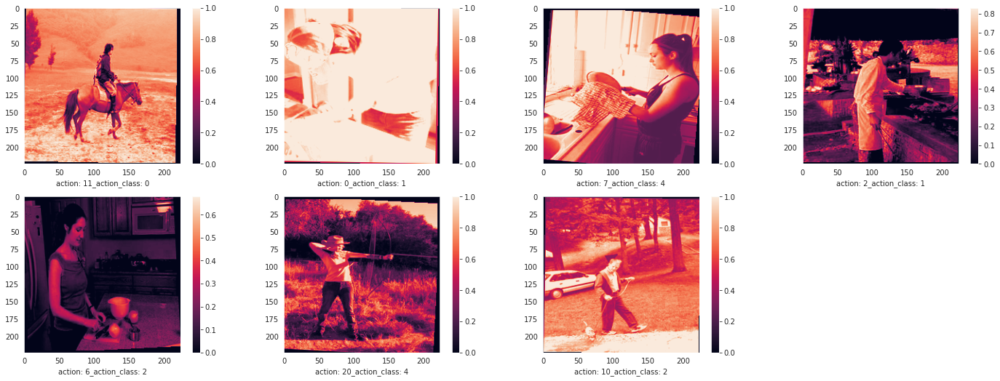

In [ ]:
plot_from_generator(aug_train_generator)

### Base CNN Model from Scratch 

In [ ]:
class BaseClassifier():
  
  def vgg_block(self, num_convs, num_channels, layer):
    for _ in range(num_convs):
      layer = Conv2D(num_channels,(3,3),padding='same', activation='relu')(layer)
    layer = MaxPooling2D(pool_size=(2,2),strides=2)(layer)
    return layer
  
  def build_cnn(self,inputs):
    """ VGG Blocks"""
    layer = self.vgg_block(1,64,inputs)
    layer = self.vgg_block(1,128,layer)
    layer = self.vgg_block(2,256,layer)
    return layer
  
  def build_action(self, inputs):
    """ Action Model """
    x = self.build_cnn(inputs)
    x = Flatten()(x)
    x = Dropout(0.5)(x)
    x = Dense(512)(x)
    x = Activation('relu')(x)
    x = Dense(21)(x)
    x = Activation('softmax', name = "action")(x)
    return x
  
  def build_action_class(self, inputs):
    """ Action Class Model"""
    x = self.build_cnn(inputs)
    x = Flatten()(x)
    x = Dropout(0.5)(x)
    x = Dense(256)(x)
    x = Activation('relu')(x)
    x = Dense(5)(x)
    x = Activation('softmax',name = "action_class")(x)
    return x
  
  def assemble_full_model(self, input_shape = (32,32,3)):
    """
    Multi-output CNN model.
    """
    input_layer = Input(shape=input_shape)
    action_model = self.build_action(input_layer)
    action_class_model = self.build_action_class(input_layer)
    model = Model(inputs = input_layer, outputs = [action_model, action_class_model],
                  name="base_action_classfier")
    return model

In [ ]:
base_model = BaseClassifier().assemble_full_model(input_shape = IMG_DIM)

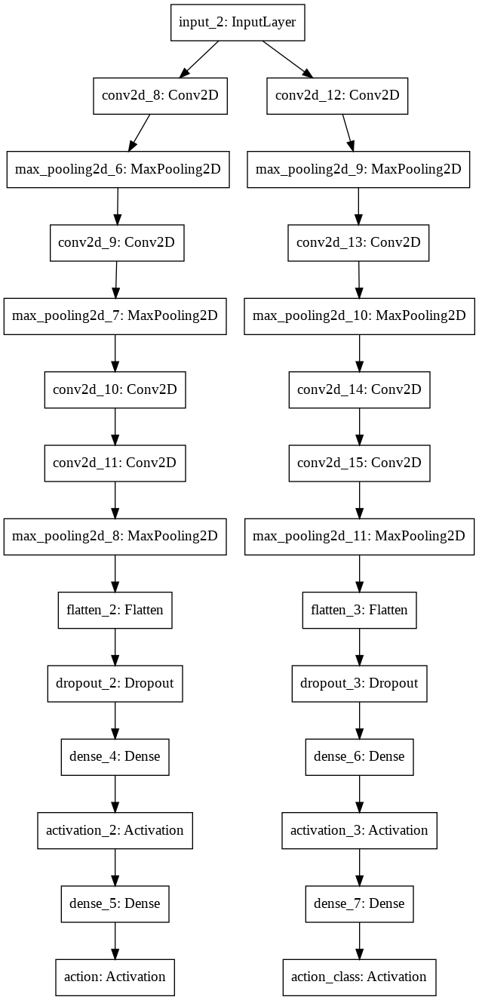

In [ ]:
tf.keras.utils.plot_model(base_model)

In [ ]:
# Inverse transform of both labels
target_action = action_encoder.inverse_transform(np.arange(21))
target_action_class = action_cls_encoder.inverse_transform(np.arange(5))

In [ ]:
# Call back (Early Stopping, Tensorboard and Model Checkpoint)
from sklearn import metrics
def get_callbacks(name, ckpt_name):
  return [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=30),
    tf.keras.callbacks.ModelCheckpoint(filepath=os.path.join(CHECKPOINT_DIR,ckpt_name),
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True),
    tf.keras.callbacks.TensorBoard(logdir/name)
  ]

def compile_and_fit(model, training_generator, validation_generator, name, ckpt_name, learning_rate = LR, max_epochs=NUM_EPOCHS):
  
  lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
    LR,
    decay_steps=STEPS_PER_EPOCH*100,
    decay_rate=1,
    staircase=False)
  # Optimizer
  optimizer = tf.keras.optimizers.Adam(lr_schedule)

  model.compile(optimizer=optimizer,
                loss = {'action':'sparse_categorical_crossentropy',
                    'action_class':'sparse_categorical_crossentropy'},
              metrics={'action':'accuracy',
                       'action_class':'accuracy'})

  model.summary()

  history = model.fit(
      training_generator,
      steps_per_epoch = STEPS_PER_EPOCH,
      batch_size = BATCH_SIZE,
      epochs=max_epochs,
      validation_data=validation_generator,
      callbacks=get_callbacks(name,ckpt_name),
      verbose=1)

  return history

def model_result(model, generator):
  
  action_preds = []
  action_trues = []
  action_cls_preds = []
  action_cls_trues = []
  N_images = len(generator.image_ids)
  
  batches = 0

  # iterate through the data generator and predict for each batch
  # hold the predictions and labels
  
  for x,[y,z] in generator.__iter__():
    action_pred, action_cls_pred = model.predict(x, verbose=0)
    
    action_pred = np.argmax(action_pred, axis = 1)
    action_cls_pred = np.argmax(action_cls_pred, axis = 1)
    # actions
    action_preds = action_preds + action_pred.tolist()
    action_trues = action_trues + y.tolist()
    
    # action class
    action_cls_preds = action_cls_preds + action_cls_pred.tolist()
    action_cls_trues = action_cls_trues + z.tolist()

    batches += 1
    if batches >= N_images / BATCH_SIZE:
        #break the loop
        break
  print("Action Macro f1-score: ", metrics.f1_score(action_trues, action_preds))
  print("Action Class Macro f1-score : ", metrics.f1_score(action_cls_trues,action_cls_preds))
  print("Action Classification Report \n", metrics.classification_report(action_trues, action_preds, target_names = target_action))
  print("Action Class Classification Report \n", metrics.classification_report(action_cls_trues, action_cls_preds, target_names = target_action_class))

In [ ]:
#Base Model Training
model_histories['Base_CNN'] = compile_and_fit(base_model, no_aug_train_generator, validation_generator, name='models/base_cnn',ckpt_name='base_cnn.ckpt')

Model: "base_action_classfier"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 224, 224, 64) 1792        input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_12 (Conv2D)              (None, 224, 224, 64) 1792        input_2[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_6 (MaxPooling2D)  (None, 112, 112, 64) 0           conv2d_8[0][0]                   
______________________________________________________________________________

In [ ]:
def plot_both_curves(histories, model_name):
  # Action
  plot_learning_curve(histories[model_name].history['action_loss'],
                      histories[model_name].history['val_action_loss'],
                      histories[model_name].history['action_accuracy'],
                      histories[model_name].history['val_action_accuracy'],
                      "Action Model's Performance")
  # Action Class
  plot_learning_curve(histories[model_name].history['action_class_loss'],
                      histories[model_name].history['val_action_class_loss'],
                      histories[model_name].history['action_class_accuracy'],
                      histories[model_name].history['val_action_class_accuracy'],
                      'Learning Curves')

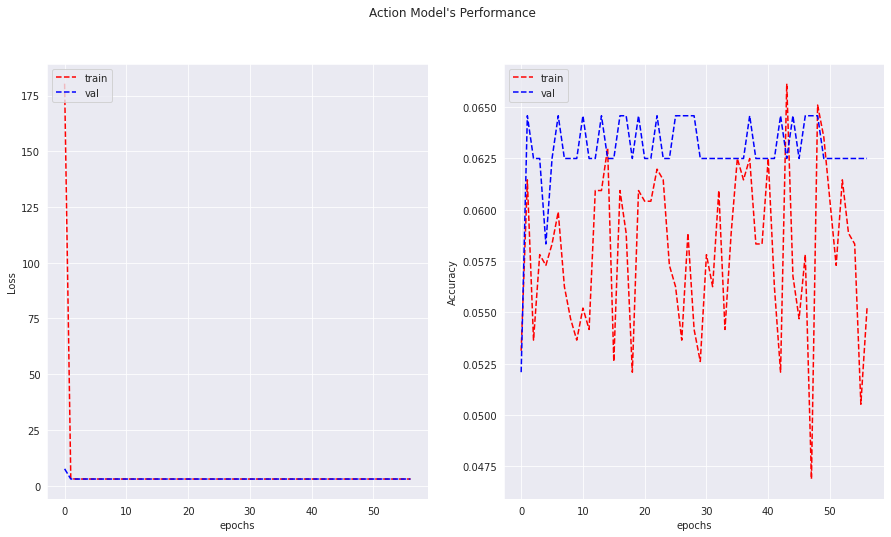

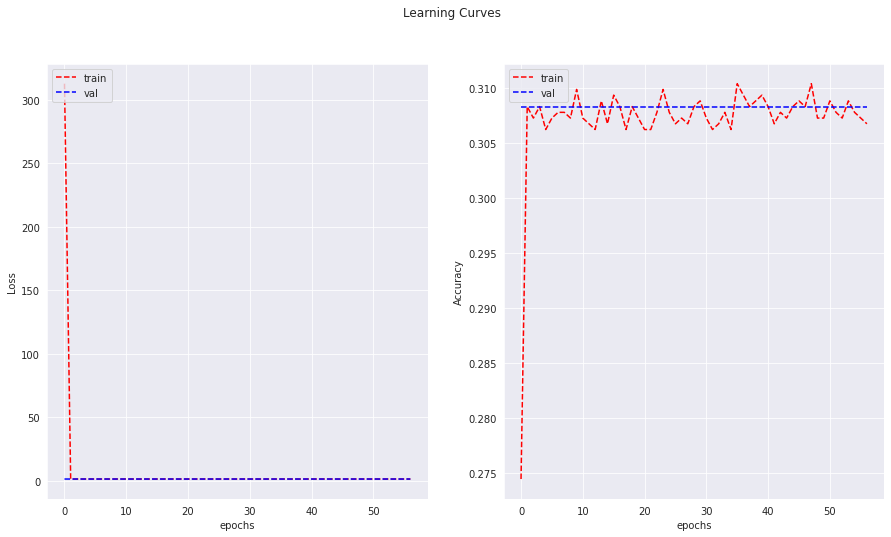

In [ ]:
plot_both_curves(model_histories, "Base_CNN")

In [ ]:
model_result(base_model, validation_generator)

Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.00      0.00      0.00        18
          climbing       0.00      0.00      0.00        31
           cooking       0.00      0.00      0.00        28
cutting_vegetables       0.00      0.00      0.00        14
   feeding_a_horse       0.00      0.00      0.00        29
         gardening       0.00      0.00      0.00        16
           jumping       0.00      0.00      0.00        30
           phoning       0.00      0.00      0.00        25
    playing_guitar       0.00      0.00      0.00        30
    playing_violin       0.00      0.00      0.00        26
     riding_a_bike       0.00      0.00      0.00        31
    riding_a_horse       0.06      1.00      0.12        30
     rowing_a_boat       0.00      0.00      0.00        14
           running       0.00      0.00      0.00        24
 shooting_an_arrow       0.00      0.00      0.00        18
     tak

##### Observation
* Underfitting: Poor performance on both traning and validation set
* Reason: Less Training Data, 3 blocks could not capture enough features to classify.
* Next Steps: Leverage Transfer learning ( From Image Classification to Action Recognition)

### Transfer Learning qithout Weights

#### VGG-16 Model

In [ ]:
vgg_base_model = tf.keras.applications.VGG16(
    include_top=False,
    weights=None,
    input_shape=IMG_DIM,
)

In [ ]:
class ActionModel():
  
  def __init__(self, input_shape, action_hidden_size, action_cls_hidden_size, dropout = 0, l2_prop = 0, training = False):
    self.input_shape = input_shape
    self.action_hidden_size = action_hidden_size
    self.action_cls_hidden_size = action_cls_hidden_size
    self.dropout = dropout
    self.l2_prop = l2_prop
    self.training = training
  
  def build_action(self, inputs, base_model):
    x = base_model(inputs, training = self.training)
    x = Flatten()(x)
    x = Dense(self.action_hidden_size,kernel_regularizer = tf.keras.regularizers.l2(self.l2_prop))(x)
    x = Activation('relu')(x)
    x = Dropout(self.dropout)(x)
    x = Dense(21)(x)
    x = Activation('softmax', name = "action")(x)
    return x

  def build_action_class(self, inputs, base_model):
    x = base_model(inputs, training = self.training)
    x = Flatten()(x)
    x = Dense(self.action_cls_hidden_size, kernel_regularizer = tf.keras.regularizers.l2(self.l2_prop))(x)
    x = Activation('relu')(x)
    x = Dropout(self.dropout)(x)
    x = Dense(5)(x)
    x = Activation('softmax',name = "action_class")(x)
    return x

  def assemble_full_model(self, base_model, name):
    """
    Assemble multi-output CNN model.
    """
    input_layer = Input(shape=self.input_shape)
    action_model = self.build_action(input_layer, base_model)
    action_class_model = self.build_action_class(input_layer,base_model)
    model = Model(inputs = input_layer, outputs = [action_model, action_class_model],
                  name=name)
    return model

In [ ]:
vgg_model = ActionModel(input_shape=IMG_DIM,
                     training=True).assemble_full_model(vgg_base_model)

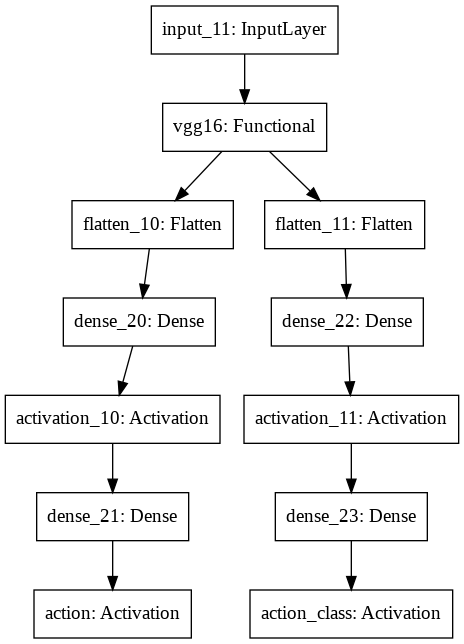

In [ ]:
tf.keras.utils.plot_model(vgg_model)

In [ ]:
model_histories['VGG_Base'] = compile_and_fit(vgg_model, no_aug_train_generator, validation_generator,'models/vgg_base',ckpt_name='vgg_base.ckpt')

Model: "vgg_action_classfier"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
vgg16 (Functional)              (None, 7, 7, 512)    14714688    input_2[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
flatten (Flatten)               (None, 25088)        0           vgg16[0][0]                      
__________________________________________________________________________________________________
flatten_1 (Flatten)             (None, 25088)        0           vgg16[1][0]   

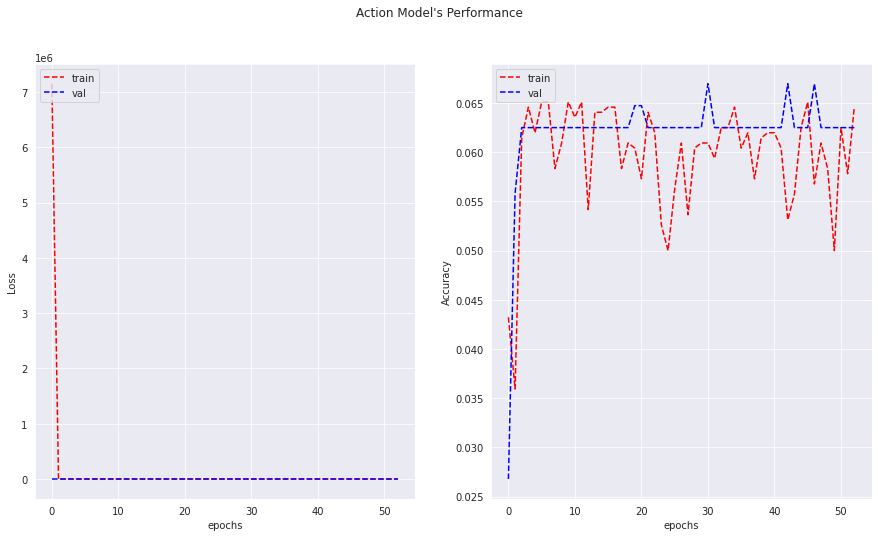

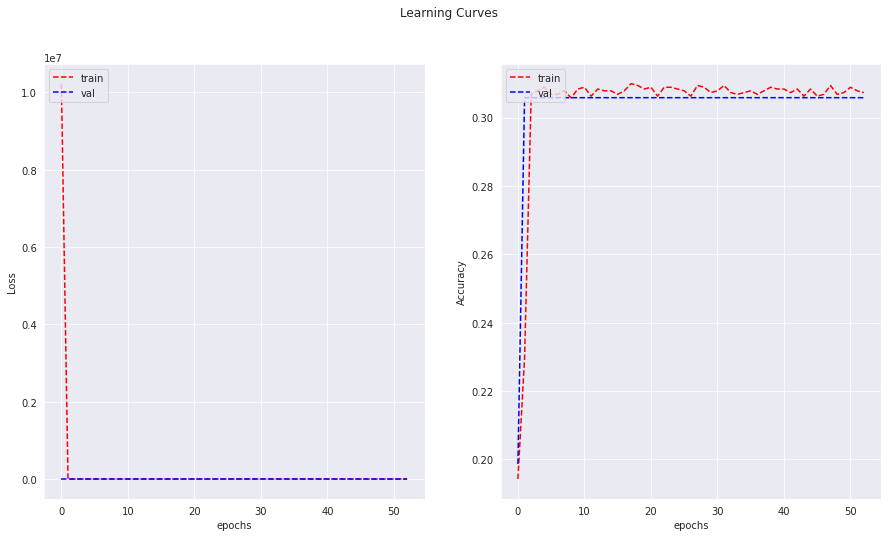

Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.00      0.00      0.00        17
          climbing       0.06      1.00      0.12        28
           cooking       0.00      0.00      0.00        25
cutting_vegetables       0.00      0.00      0.00        12
   feeding_a_horse       0.00      0.00      0.00        29
         gardening       0.00      0.00      0.00        15
           jumping       0.00      0.00      0.00        29
           phoning       0.00      0.00      0.00        22
    playing_guitar       0.00      0.00      0.00        28
    playing_violin       0.00      0.00      0.00        25
     riding_a_bike       0.00      0.00      0.00        30
    riding_a_horse       0.00      0.00      0.00        28
     rowing_a_boat       0.00      0.00      0.00        13
           running       0.00      0.00      0.00        22
 shooting_an_arrow       0.00      0.00      0.00        15
     tak

In [ ]:
plot_both_curves(model_histories, "VGG_Base")
model_result(vgg_model,validation_generator)

Observation: Still underfitting. Randomm initialisation of weights could to learn properly. 

Next Step: Use Imagenet weight and fine-tune to our task.

#### Fine Tuning VGG-16

Steps: First freeze base layers of VGG and train top layers. Once the weights are learnt from the top, unfreeze VGG layers and fine-tune

In [ ]:
vgg_16_model = tf.keras.applications.VGG16(
    include_top=False,
    weights='imagenet',
    input_shape=IMG_DIM,
)
# Freeze base model
vgg_16_model.trainable = False

vgg_16 = ActionModel(input_shape=IMG_DIM,
                  training=False).assemble_full_model(vgg_16_model,name = "VGG_16_Model")

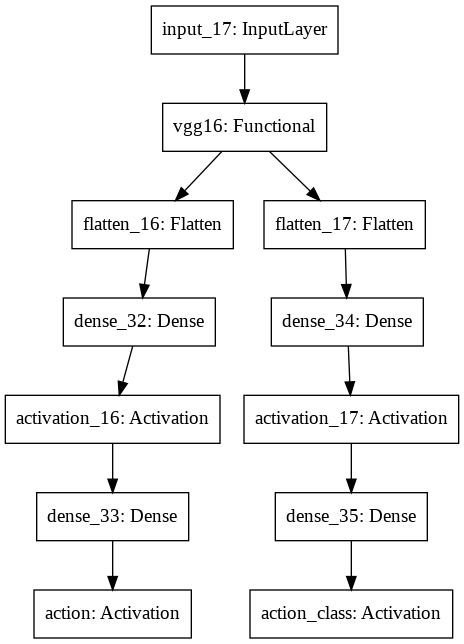

In [ ]:
tf.keras.utils.plot_model(vgg_16)

In [ ]:
model_histories['VGG_16'] = compile_and_fit(vgg_16,
                                            no_aug_train_generator,
                                            validation_generator,
                                            'models/vgg_16',
                                            ckpt_name='vgg_16.ckpt')

Model: "VGG_16_Model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
vgg16 (Functional)              (None, 7, 7, 512)    14714688    input_7[0][0]                    
                                                                 input_7[0][0]                    
__________________________________________________________________________________________________
flatten_2 (Flatten)             (None, 25088)        0           vgg16[0][0]                      
__________________________________________________________________________________________________
flatten_3 (Flatten)             (None, 25088)        0           vgg16[1][0]           

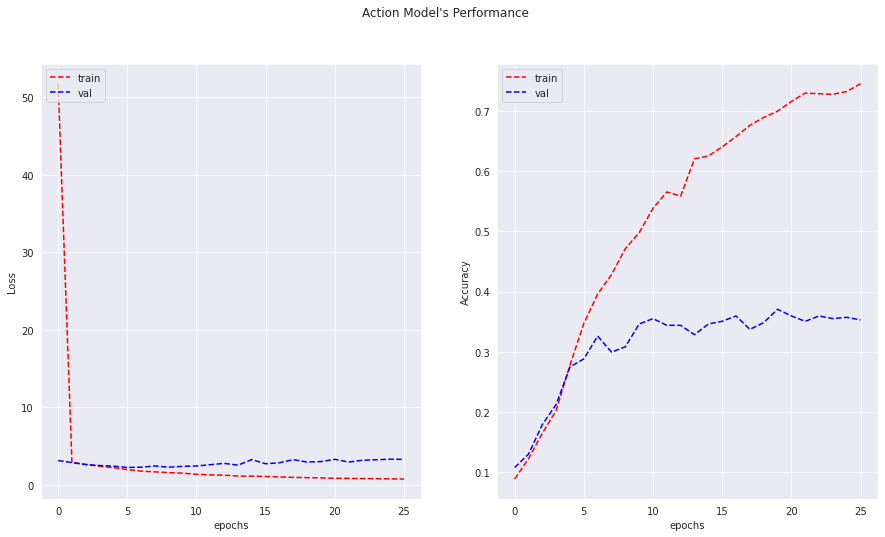

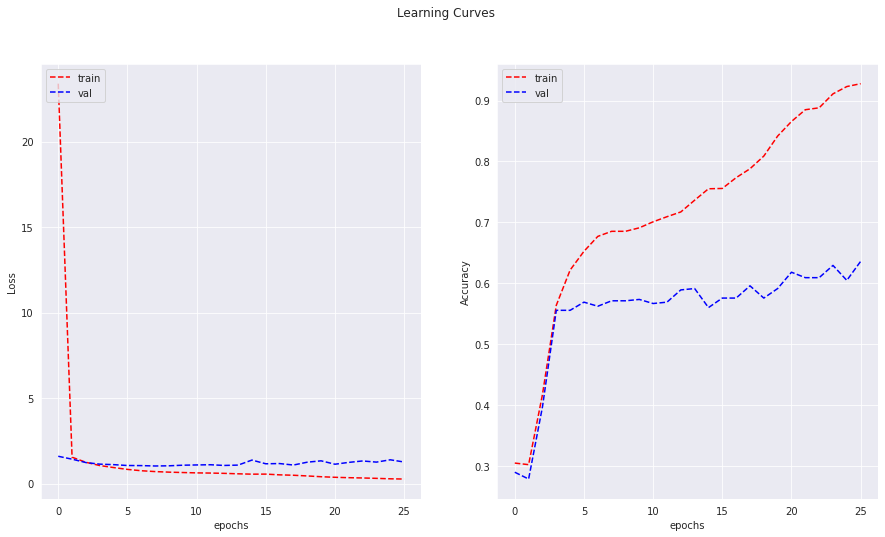

Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.75      0.18      0.29        17
          climbing       0.74      0.61      0.67        28
           cooking       0.11      0.28      0.16        25
cutting_vegetables       0.00      0.00      0.00        12
   feeding_a_horse       0.56      0.48      0.52        29
         gardening       0.57      0.27      0.36        15
           jumping       0.33      0.41      0.37        29
           phoning       0.00      0.00      0.00        22
    playing_guitar       0.39      0.43      0.41        28
    playing_violin       0.19      0.28      0.23        25
     riding_a_bike       0.90      0.87      0.88        30
    riding_a_horse       0.65      0.39      0.49        28
     rowing_a_boat       0.64      0.54      0.58        13
           running       0.38      0.45      0.42        22
 shooting_an_arrow       0.18      0.20      0.19        15
     tak

In [ ]:
plot_both_curves(model_histories, "VGG_16")
model_result(vgg_16,validation_generator)

Observation: Using the weights from imagenet, we notice overfitting. This is common when using small number of training samples. We apply data augmentation, introduce dropout and add weight regularizers to reduce model complexity. 

##### VGG with Augmentation

In [ ]:
model_histories['VGG_16_Aug'] = compile_and_fit(vgg_16,
                                            aug_train_generator,
                                            validation_generator,
                                            'models/vgg_16_aug',
                                            ckpt_name='vgg_16_aug.ckpt')

Model: "VGG_16_Model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
vgg16 (Functional)              (None, 7, 7, 512)    14714688    input_7[0][0]                    
                                                                 input_7[0][0]                    
__________________________________________________________________________________________________
flatten_2 (Flatten)             (None, 25088)        0           vgg16[0][0]                      
__________________________________________________________________________________________________
flatten_3 (Flatten)             (None, 25088)        0           vgg16[1][0]           

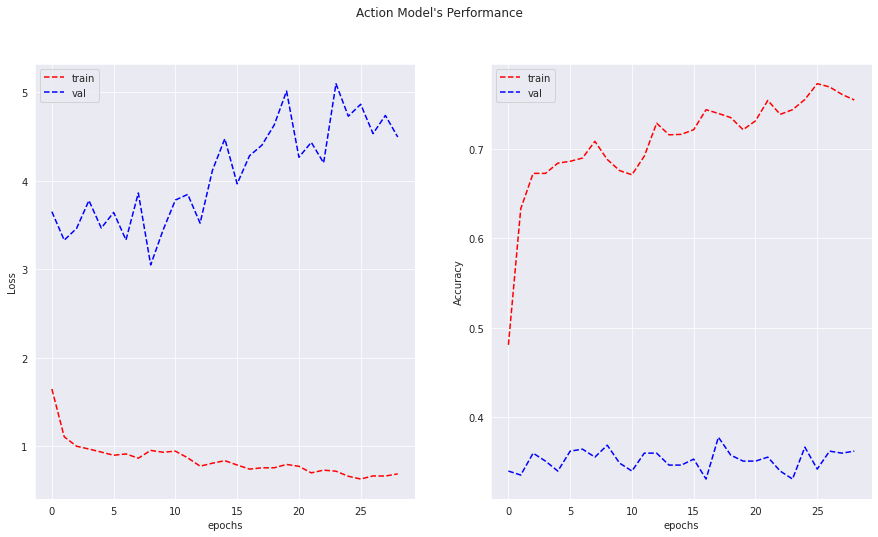

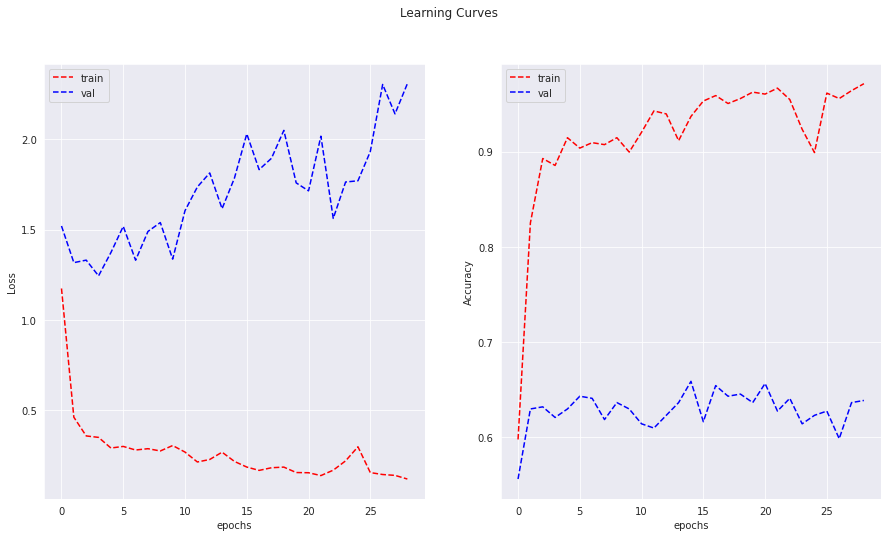

Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.00      0.00      0.00        17
          climbing       0.85      0.39      0.54        28
           cooking       0.21      0.48      0.30        25
cutting_vegetables       0.00      0.00      0.00        12
   feeding_a_horse       0.58      0.48      0.53        29
         gardening       0.36      0.27      0.31        15
           jumping       0.34      0.38      0.36        29
           phoning       0.14      0.05      0.07        22
    playing_guitar       0.39      0.46      0.43        28
    playing_violin       0.23      0.28      0.25        25
     riding_a_bike       1.00      0.70      0.82        30
    riding_a_horse       0.46      0.46      0.46        28
     rowing_a_boat       1.00      0.54      0.70        13
           running       0.46      0.50      0.48        22
 shooting_an_arrow       0.27      0.40      0.32        15
     tak

In [ ]:
plot_both_curves(model_histories, "VGG_16_Aug")
model_result(vgg_16,validation_generator)

In [ ]:
vgg_16_drop = ActionModel(input_shape=IMG_DIM,
                       dropout=0.1,
                  training=False).assemble_full_model(vgg_16_model,'VGG_Action_Classifier')

In [ ]:
model_histories['VGG_16_Drop'] = compile_and_fit(vgg_16_drop,
                                            aug_train_generator,
                                            validation_generator,
                                            'models/vgg_16_drop',
                                            ckpt_name='vgg_16_drop.ckpt')

Model: "VGG_Action_Classifier"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
vgg16 (Functional)              (None, 7, 7, 512)    14714688    input_9[0][0]                    
                                                                 input_9[0][0]                    
__________________________________________________________________________________________________
flatten_6 (Flatten)             (None, 25088)        0           vgg16[4][0]                      
__________________________________________________________________________________________________
flatten_7 (Flatten)             (None, 25088)        0           vgg16[5][0]  

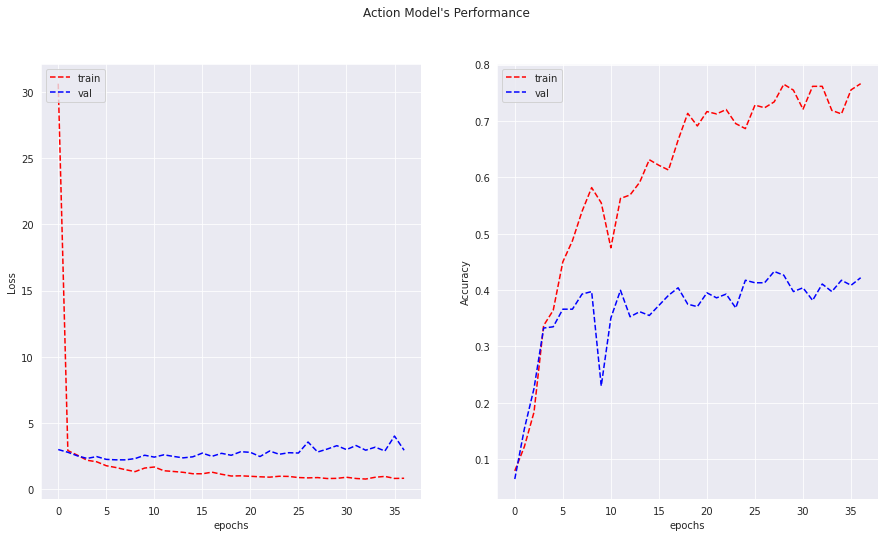

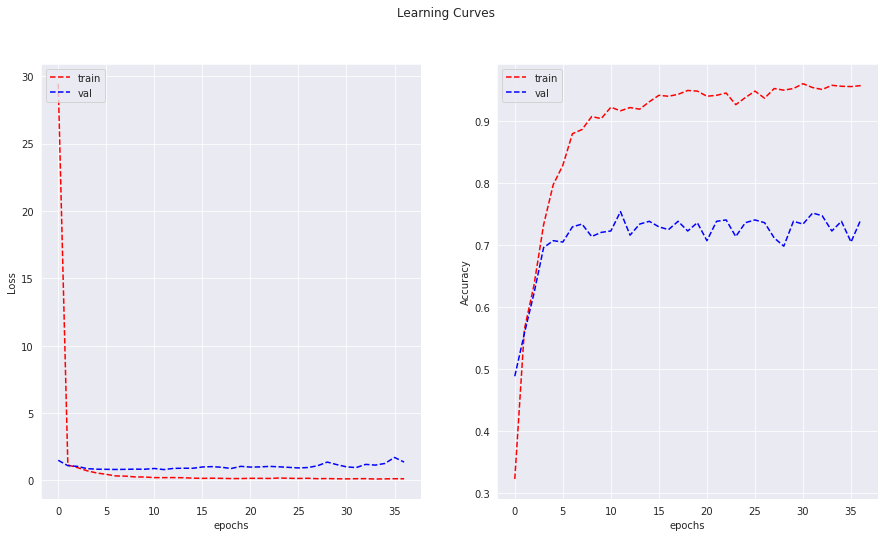

Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.80      0.24      0.36        17
          climbing       0.70      0.68      0.69        28
           cooking       0.24      0.40      0.30        25
cutting_vegetables       0.00      0.00      0.00        12
   feeding_a_horse       0.62      0.28      0.38        29
         gardening       0.11      0.20      0.14        15
           jumping       0.43      0.41      0.42        29
           phoning       0.18      0.09      0.12        22
    playing_guitar       0.60      0.89      0.71        28
    playing_violin       0.71      0.40      0.51        25
     riding_a_bike       0.69      0.73      0.71        30
    riding_a_horse       0.53      0.36      0.43        28
     rowing_a_boat       1.00      0.31      0.47        13
           running       0.36      0.41      0.38        22
 shooting_an_arrow       0.50      0.40      0.44        15
     tak

In [ ]:
plot_both_curves(model_histories, "VGG_16_Drop")
model_result(vgg_16_drop,validation_generator)


Further tuning of VGG_16 is available in another notebook due to GPU limitation  from a single account. 